<a href="https://colab.research.google.com/github/zurriyatafatni/compfest_DataScienceCompetition/blob/main/compfest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ***Raw Data*** 

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import csv

In [ ]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.width',None)

In [ ]:
car_data = pd.read_csv("used_car_data.csv")
df = pd.DataFrame(car_data)

In [ ]:
df.head()
# print(car_data)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74


In [ ]:
df.count()

Name                 6019
Location             6019
Year                 6019
Kilometers_Driven    6019
Fuel_Type            6019
Transmission         6019
Owner_Type           6019
Mileage              6017
Engine               5983
Power                5983
Seats                5977
Price                6019
dtype: int64

In [ ]:
#sorting values, ascending/descending
print(df.sort_values('Name', ascending=True))

                                                   Name    Location  Year  \
1221                     Ambassador Classic Nova Diesel     Chennai  2003   
398                           Audi A3 35 TDI Attraction     Chennai  2014   
4782                             Audi A3 35 TDI Premium      Mumbai  2016   
4989                        Audi A3 35 TDI Premium Plus      Mumbai  2016   
1954                          Audi A3 35 TDI Technology       Delhi  2017   
2626                                   Audi A4 1.8 TFSI     Kolkata  2010   
3361                                   Audi A4 1.8 TFSI      Mumbai  2011   
5100                Audi A4 1.8 TFSI Technology Edition   Hyderabad  2012   
1316                                    Audi A4 2.0 TDI       Delhi  2013   
2240                                    Audi A4 2.0 TDI   Hyderabad  2014   
1918                                    Audi A4 2.0 TDI       Kochi  2013   
2005                                    Audi A4 2.0 TDI   Ahmedabad  2013   

# ***Preprocessing Data***

In [ ]:
#drop row with empty value
drop_empty = df.dropna() #menghapus row dengan value yg kosong

drop_empty.to_csv('clean_data.csv', index=False)

#read dataset OK
dataset_new = pd.read_csv('clean_data.csv')
df_new = pd.DataFrame(dataset_new)

df_new.count()


Name                 5975
Location             5975
Year                 5975
Kilometers_Driven    5975
Fuel_Type            5975
Transmission         5975
Owner_Type           5975
Mileage              5975
Engine               5975
Power                5975
Seats                5975
Price                5975
dtype: int64

In [ ]:
#drop row with value is 0 in "seats" column
df_new = df_new[df_new['Seats']!= 0]
df_new.reset_index(drop=True)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,LPG,Manual,First,21.1 km/kg,814 CC,55.2 bhp,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,Diesel,Manual,First,23.08 kmpl,1461 CC,63.1 bhp,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,Diesel,Manual,First,20.54 kmpl,1598 CC,103.6 bhp,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,Diesel,Manual,Second,22.3 kmpl,1248 CC,74 bhp,5.0,1.95


In [ ]:
#drop row with value is null in "Power" column
df_new = df_new[df_new['Power']!= 'null bhp']
df_new.reset_index(drop=True)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,LPG,Manual,First,21.1 km/kg,814 CC,55.2 bhp,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,Diesel,Manual,First,23.08 kmpl,1461 CC,63.1 bhp,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,Diesel,Manual,First,20.54 kmpl,1598 CC,103.6 bhp,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,Diesel,Manual,Second,22.3 kmpl,1248 CC,74 bhp,5.0,1.95


In [ ]:
df_new.info()
df_new.count()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5872 entries, 0 to 5974
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               5872 non-null   object 
 1   Location           5872 non-null   object 
 2   Year               5872 non-null   int64  
 3   Kilometers_Driven  5872 non-null   int64  
 4   Fuel_Type          5872 non-null   object 
 5   Transmission       5872 non-null   object 
 6   Owner_Type         5872 non-null   object 
 7   Mileage            5872 non-null   object 
 8   Engine             5872 non-null   object 
 9   Power              5872 non-null   object 
 10  Seats              5872 non-null   float64
 11  Price              5872 non-null   float64
dtypes: float64(2), int64(2), object(8)
memory usage: 596.4+ KB


Name                 5872
Location             5872
Year                 5872
Kilometers_Driven    5872
Fuel_Type            5872
Transmission         5872
Owner_Type           5872
Mileage              5872
Engine               5872
Power                5872
Seats                5872
Price                5872
dtype: int64

# ***Data Transformation***

In [ ]:
#fuel_type column
fuel_type_name = df_new.Fuel_Type.unique()
fuel_type_name = pd.Series(fuel_type_name)
fuel_type_name = fuel_type_name.tolist()
print('Fuel Type ',fuel_type_name)
# fuel_type = pd.Series(fuel_type_name)
# fuel_type = fuel_type.count()
# print(fuel_type)

#transmission column
transmission = df_new.Transmission.unique()
transmission = pd.Series(transmission)
transmission = transmission.tolist()
print('Transmission ', transmission)

#Owner type
owner_type = df_new.Owner_Type.unique()
owner_type = pd.Series(owner_type)
owner_type = owner_type.tolist()
print('Owner_Type ', owner_type)

#seats
seats = df_new.astype({"Seats": int})
seats = seats.Seats.unique()
seats = pd.Series(seats)
seats = seats.tolist()
print('Seats ', seats)

# for x in fuel_type_name:
#   for i in range(1,4):
#     fuel_type_transform = {x:i}

# df_new.fuel_type_transform = [fuel_type_transform[item] for item in df_new.fuel_type_transform]
# print(df_new)


Fuel Type  ['CNG', 'Diesel', 'Petrol', 'LPG']
Transmission  ['Manual', 'Automatic']
Owner_Type  ['First', 'Second', 'Fourth & Above', 'Third']
Seats  [5, 7, 8, 4, 6, 2, 10, 9]


In [ ]:
#fuel_type transform data
fuel_type = {'CNG': 1, 'Diesel': 2, 'Petrol': 3, 'LPG': 4}
df_new.Fuel_Type = [fuel_type[item] for item in df_new.Fuel_Type]
# df_new.reset_index()
print(df_new[:10])

df_new.to_csv('transform_fuel_type.csv')

                                  Name    Location  Year  Kilometers_Driven  \
0               Maruti Wagon R LXI CNG      Mumbai  2010              72000   
1     Hyundai Creta 1.6 CRDi SX Option        Pune  2015              41000   
2                         Honda Jazz V     Chennai  2011              46000   
3                    Maruti Ertiga VDI     Chennai  2012              87000   
4      Audi A4 New 2.0 TDI Multitronic  Coimbatore  2013              40670   
5      Hyundai EON LPG Era Plus Option   Hyderabad  2012              75000   
6               Nissan Micra Diesel XV      Jaipur  2013              86999   
7    Toyota Innova Crysta 2.8 GX AT 8S      Mumbai  2016              36000   
8  Volkswagen Vento Diesel Comfortline        Pune  2013              64430   
9       Tata Indica Vista Quadrajet LS     Chennai  2012              65932   

   Fuel_Type Transmission Owner_Type     Mileage   Engine      Power  Seats  \
0          1       Manual      First  26.6 km/kg   

In [ ]:
#transmission transform data
transmission_data = pd.read_csv('transform_fuel_type.csv')
df_transmission = pd.DataFrame(transmission_data)

transmission = {'Automatic': 1, 'Manual': 2}
df_transmission.Transmission = [transmission[item] for item in df_transmission.Transmission]
print(df_transmission[:10])
df_transmission.to_csv('transform_transmission.csv')

   Unnamed: 0                                 Name    Location  Year  \
0           0               Maruti Wagon R LXI CNG      Mumbai  2010   
1           1     Hyundai Creta 1.6 CRDi SX Option        Pune  2015   
2           2                         Honda Jazz V     Chennai  2011   
3           3                    Maruti Ertiga VDI     Chennai  2012   
4           4      Audi A4 New 2.0 TDI Multitronic  Coimbatore  2013   
5           5      Hyundai EON LPG Era Plus Option   Hyderabad  2012   
6           6               Nissan Micra Diesel XV      Jaipur  2013   
7           7    Toyota Innova Crysta 2.8 GX AT 8S      Mumbai  2016   
8           8  Volkswagen Vento Diesel Comfortline        Pune  2013   
9           9       Tata Indica Vista Quadrajet LS     Chennai  2012   

   Kilometers_Driven  Fuel_Type  Transmission Owner_Type     Mileage   Engine  \
0              72000          1             2      First  26.6 km/kg   998 CC   
1              41000          2             2

In [ ]:
#owner_type transform data
dataset_new = pd.read_csv('transform_transmission.csv')
df_new = pd.DataFrame(dataset_new)

owner_type = {'First': 1, 'Second': 2, 'Third': 3, 'Fourth & Above': 4}
df_new.Owner_Type = [owner_type[item] for item in df_new.Owner_Type]

print(df_new[:10])
df_new.to_csv('transform_owner_type.csv')

   Unnamed: 0  Unnamed: 0.1                                 Name    Location  \
0           0             0               Maruti Wagon R LXI CNG      Mumbai   
1           1             1     Hyundai Creta 1.6 CRDi SX Option        Pune   
2           2             2                         Honda Jazz V     Chennai   
3           3             3                    Maruti Ertiga VDI     Chennai   
4           4             4      Audi A4 New 2.0 TDI Multitronic  Coimbatore   
5           5             5      Hyundai EON LPG Era Plus Option   Hyderabad   
6           6             6               Nissan Micra Diesel XV      Jaipur   
7           7             7    Toyota Innova Crysta 2.8 GX AT 8S      Mumbai   
8           8             8  Volkswagen Vento Diesel Comfortline        Pune   
9           9             9       Tata Indica Vista Quadrajet LS     Chennai   

   Year  Kilometers_Driven  Fuel_Type  Transmission  Owner_Type     Mileage  \
0  2010              72000          1   

In [ ]:
df_new.drop(df_new.iloc[:, 0:2], axis = 1, inplace = True) 
df_new = df_new[df_new['Seats']!= 0]
df_new.reset_index(drop=True)
df_new.to_csv('data_transform.csv', index=False)
df_new[:10]


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,4,2,1,21.1 km/kg,814 CC,55.2 bhp,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,2,2,1,23.08 kmpl,1461 CC,63.1 bhp,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,2,1,1,11.36 kmpl,2755 CC,171.5 bhp,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,2,2,1,20.54 kmpl,1598 CC,103.6 bhp,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.3 kmpl,1248 CC,74 bhp,5.0,1.95


In [ ]:
#replace string in engine column
df_new['Engine'] = df_new['Engine'].str.replace('CC','')
df_new[:10]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.6 km/kg,998,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67 kmpl,1582,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.2 kmpl,1199,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77 kmpl,1248,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.2 kmpl,1968,140.8 bhp,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,4,2,1,21.1 km/kg,814,55.2 bhp,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,2,2,1,23.08 kmpl,1461,63.1 bhp,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,2,1,1,11.36 kmpl,2755,171.5 bhp,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,2,2,1,20.54 kmpl,1598,103.6 bhp,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.3 kmpl,1248,74 bhp,5.0,1.95


In [ ]:
df_new['Power'] = df_new['Power'].str.replace('bhp','')
df_new[:10]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.6 km/kg,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67 kmpl,1582,126.2,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.2 kmpl,1199,88.7,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77 kmpl,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.2 kmpl,1968,140.8,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,4,2,1,21.1 km/kg,814,55.2,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,2,2,1,23.08 kmpl,1461,63.1,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,2,1,1,11.36 kmpl,2755,171.5,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,2,2,1,20.54 kmpl,1598,103.6,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.3 kmpl,1248,74,5.0,1.95


In [ ]:
df_new['Mileage'] = df_new['Mileage'].str.replace('kmpl','')
df_new[:10]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.6 km/kg,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.2,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.2,1199,88.7,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.2,1968,140.8,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,4,2,1,21.1 km/kg,814,55.2,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,2,2,1,23.08,1461,63.1,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,2,1,1,11.36,2755,171.5,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,2,2,1,20.54,1598,103.6,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.3,1248,74,5.0,1.95


In [ ]:
df_new['Mileage'] = df_new['Mileage'].str.replace('km/kg','')
df_new.to_csv('transform_ok.csv', index=False)
df_new[:10]

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.6,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.2,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.2,1199,88.7,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.2,1968,140.8,5.0,17.74
5,Hyundai EON LPG Era Plus Option,Hyderabad,2012,75000,4,2,1,21.1,814,55.2,5.0,2.35
6,Nissan Micra Diesel XV,Jaipur,2013,86999,2,2,1,23.08,1461,63.1,5.0,3.50
7,Toyota Innova Crysta 2.8 GX AT 8S,Mumbai,2016,36000,2,1,1,11.36,2755,171.5,8.0,17.50
8,Volkswagen Vento Diesel Comfortline,Pune,2013,64430,2,2,1,20.54,1598,103.6,5.0,5.20
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.3,1248,74,5.0,1.95


In [ ]:
new_transform = pd.read_csv('transform_ok.csv')
new_transform.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5872 entries, 0 to 5871
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               5872 non-null   object 
 1   Location           5872 non-null   object 
 2   Year               5872 non-null   int64  
 3   Kilometers_Driven  5872 non-null   int64  
 4   Fuel_Type          5872 non-null   int64  
 5   Transmission       5872 non-null   int64  
 6   Owner_Type         5872 non-null   int64  
 7   Mileage            5872 non-null   float64
 8   Engine             5872 non-null   int64  
 9   Power              5872 non-null   float64
 10  Seats              5872 non-null   float64
 11  Price              5872 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 550.6+ KB


In [ ]:
transform = pd.read_csv('transform_ok.csv')

# **Nomor 1**

In [ ]:
#unique car name
#print car name to list
car_name =transform.Name.unique()
print(car_name)

list_name = pd.Series(car_name)


count_name = pd.Series(transform['Name'])
count_name = count_name.sort_values(ascending=True)

#car name to DataFrame
car_name_fix = count_name.value_counts().rename_axis('Car Name').reset_index(name='Counts')
print(car_name_fix[:5])

# print(car_name_fix)

#save car name to csv file
car_name_fix.to_csv('nomor1.csv',index=False)


#count all list of car 
count_all = list_name.count()
print('')
print('Jumlah jenis seluruh mobil', count_all)

['Maruti Wagon R LXI CNG' 'Hyundai Creta 1.6 CRDi SX Option'
 'Honda Jazz V' ... 'Volkswagen Polo IPL II 1.2 Petrol Highline'
 'Tata Bolt Revotron XT' 'Mahindra Xylo D4 BSIV']
                 Car Name  Counts
0  Mahindra XUV500 W8 2WD      49
1        Maruti Swift VDI      45
2     Honda City 1.5 S MT      34
3  Maruti Swift Dzire VDI      34
4      Hyundai i10 Sportz      30

Jumlah jenis seluruh mobil 1811


# **Nomor 2**

In [ ]:
#drop row if owner_type equal 1 (first)
drop_owner_df = transform[transform['Owner_Type']!= 1]
drop_owner_df.reset_index(drop=True)
# drop_owner_df.index = [x for x in range(1, len(drop_owner_df.values)+1)]
# drop_owner_df.index.name = 'id'
drop_owner_df.to_csv('data_mobil_bekas.csv', index=False)
drop_owner_df[:10]


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.8,5.0,17.74
9,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.30,1248,74.0,5.0,1.95
14,Land Rover Freelander 2 TD4 SE,Pune,2012,85000,2,1,2,0.00,2179,115.0,5.0,17.50
21,Maruti S Cross DDiS 200 Alpha,Bangalore,2015,55392,2,2,2,23.65,1248,88.5,5.0,8.25
27,Maruti Alto K10 2010-2014 VXI,Hyderabad,2013,54000,3,2,2,20.92,998,67.1,5.0,2.75
29,Toyota Innova 2.5 V Diesel 7-seater,Mumbai,2007,262000,2,2,4,12.80,2494,102.0,7.0,4.00
32,Mahindra Ssangyong Rexton RX7,Bangalore,2013,72000,2,1,2,11.18,2696,184.0,7.0,12.50
34,Volkswagen Vento 1.6 Highline,Coimbatore,2014,55431,3,2,2,16.09,1598,103.5,5.0,6.98
35,Maruti Wagon R LXI BSIII,Jaipur,2009,83816,3,2,2,14.00,1061,64.0,5.0,1.85
40,Maruti Alto LXi,Delhi,2008,90000,3,2,2,19.70,796,46.3,5.0,1.25


In [ ]:
drop_owner_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1033 entries, 4 to 5869
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               1033 non-null   object 
 1   Location           1033 non-null   object 
 2   Year               1033 non-null   int64  
 3   Kilometers_Driven  1033 non-null   int64  
 4   Fuel_Type          1033 non-null   int64  
 5   Transmission       1033 non-null   int64  
 6   Owner_Type         1033 non-null   int64  
 7   Mileage            1033 non-null   float64
 8   Engine             1033 non-null   int64  
 9   Power              1033 non-null   float64
 10  Seats              1033 non-null   float64
 11  Price              1033 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 104.9+ KB


In [ ]:
location_df = pd.read_csv('data_mobil_bekas.csv')

location =location_df.Location.unique()
print(location)
list_location = pd.Series(location)


count_location = pd.Series(location_df['Location'])
count_location = count_location.sort_values(ascending=True)

#location name to DataFrame
location_name_fix = count_location.value_counts().rename_axis('Location').reset_index(name='Jumlah mobil bekas')
print(location_name_fix)

#save car name to csv file
location_name_fix.to_csv('nomor2.csv',index=False)


#count all list of car 
count_all = list_location.count()
print('jumlah seluruh lokasi', count_all)

['Coimbatore' 'Chennai' 'Pune' 'Bangalore' 'Hyderabad' 'Mumbai' 'Jaipur'
 'Delhi' 'Ahmedabad' 'Kolkata' 'Kochi']
      Location  Jumlah mobil bekas
0         Pune                 186
1      Chennai                 149
2       Mumbai                 128
3    Bangalore                 122
4       Jaipur                 106
5        Delhi                  96
6    Hyderabad                  80
7   Coimbatore                  65
8    Ahmedabad                  36
9        Kochi                  35
10     Kolkata                  30
jumlah seluruh lokasi 11


# **Nomor 3**

In [ ]:
#read data mobil bekas
data_mobil = pd.read_csv('data_mobil_bekas.csv')
data_mobil.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.8,5.0,17.74
1,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.30,1248,74.0,5.0,1.95
2,Land Rover Freelander 2 TD4 SE,Pune,2012,85000,2,1,2,0.00,2179,115.0,5.0,17.50
3,Maruti S Cross DDiS 200 Alpha,Bangalore,2015,55392,2,2,2,23.65,1248,88.5,5.0,8.25
4,Maruti Alto K10 2010-2014 VXI,Hyderabad,2013,54000,3,2,2,20.92,998,67.1,5.0,2.75


In [ ]:
data_mobil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1033 entries, 0 to 1032
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               1033 non-null   object 
 1   Location           1033 non-null   object 
 2   Year               1033 non-null   int64  
 3   Kilometers_Driven  1033 non-null   int64  
 4   Fuel_Type          1033 non-null   int64  
 5   Transmission       1033 non-null   int64  
 6   Owner_Type         1033 non-null   int64  
 7   Mileage            1033 non-null   float64
 8   Engine             1033 non-null   int64  
 9   Power              1033 non-null   float64
 10  Seats              1033 non-null   float64
 11  Price              1033 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 97.0+ KB


In [ ]:
data_mobil.describe()

,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
count,1033.000000,1033.000000,1033.000000,1033.000000,1033.000000,1033.000000,1033.00000,1033.000000,1033.000000,1033.000000
mean,2010.982575,73212.829622,2.484027,1.705712,2.111326,16.935721,1699.79090,116.795973,5.289448,7.509197
std,3.365017,37152.196092,0.522726,0.455943,0.335551,4.172659,633.55304,57.967189,0.845906,9.962366
min,1998.000000,3000.000000,1.000000,1.000000,2.000000,0.000000,624.00000,35.000000,2.000000,0.440000
25%,2009.000000,48002.000000,2.000000,1.000000,2.000000,13.930000,1199.00000,75.000000,5.000000,2.450000
50%,2011.000000,67000.000000,2.000000,2.000000,2.000000,17.000000,1498.00000,100.600000,5.000000,4.250000
75%,2013.000000,90000.000000,3.000000,2.000000,2.000000,19.300000,1995.00000,143.000000,5.000000,8.000000
max,2018.000000,262000.000000,4.000000,2.000000,4.000000,33.440000,5461.00000,560.000000,10.000000,120.000000


In [ ]:
data_mobil_bekas = data_mobil.loc[:,['Year', 'Owner_Type']]
data_mobil_bekas[:10]

,Year,Owner_Type
0,2013,2
1,2012,2
2,2012,2
3,2015,2
4,2013,2
5,2007,4
6,2013,2
7,2014,2
8,2009,2
9,2008,2


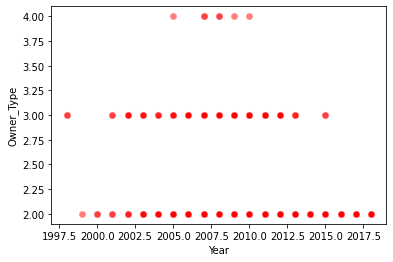

In [ ]:
#plotting data
sns.scatterplot(x='Year', y='Owner_Type', data=data_mobil, color='red', s=50, alpha=0.5)

In [ ]:
data_array = np.array(data_mobil_bekas)
print(data_array)

[[2013    2]
 [2012    2]
 [2012    2]
 ...
 [2014    2]
 [2013    2]
 [2012    2]]


In [ ]:
# Menentukan dan mengkonfigurasi fungsi kmeans
kmeans = KMeans(n_clusters = 3, random_state=123)
# Menentukan kluster dari dat
kmeans.fit(data_array)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=123, tol=0.0001, verbose=0)

In [ ]:
print(kmeans.cluster_centers_)

[[2.01065412e+03 2.11764706e+00]
 [2.00623404e+03 2.25531915e+00]
 [2.01434853e+03 2.01340483e+00]]


In [ ]:
# Menampilkan hasil kluster
print(kmeans.labels_)
# Menambahkan kolom "kluster" 
data_mobil["kluster"] = kmeans.labels_
data_mobil.head()


[2 0 0 ... 2 2 0]


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,kluster
0,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.8,5.0,17.74,2
1,Tata Indica Vista Quadrajet LS,Chennai,2012,65932,2,2,2,22.30,1248,74.0,5.0,1.95,0
2,Land Rover Freelander 2 TD4 SE,Pune,2012,85000,2,1,2,0.00,2179,115.0,5.0,17.50,0
3,Maruti S Cross DDiS 200 Alpha,Bangalore,2015,55392,2,2,2,23.65,1248,88.5,5.0,8.25,2
4,Maruti Alto K10 2010-2014 VXI,Hyderabad,2013,54000,3,2,2,20.92,998,67.1,5.0,2.75,2


In [ ]:
#save to csv
data_mobil.to_csv('nomor3.csv', index=False)

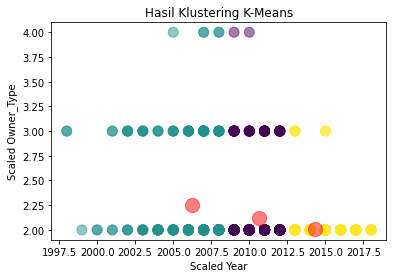

In [ ]:
#hasil kluster dalam bentuk plotting
fig, ax = plt.subplots()
sct = ax.scatter(data_array[:,0], data_array[:,1], s = 100,
c = data_mobil.kluster, marker = "o", alpha = 0.5)
centers = kmeans.cluster_centers_
ax.scatter(centers[:,0], centers[:,1], c='red', s=200, alpha=0.5)
plt.title("Hasil Klustering K-Means")
plt.xlabel("Scaled Year")
plt.ylabel("Scaled Owner_Type")
plt.show()

Melihat frekuensi distribusi mobil berdasarkan tahun

In [ ]:
freq =data_mobil.Year.unique()
print(freq)
list_year = pd.Series(freq)

count_year = pd.Series(data_mobil['Year'])
count_year = count_year.sort_values()

#freq data per year to DataFrame
freq_data = count_year.value_counts().rename_axis('Year').reset_index(name='Jumlah mobil bekas').sort_values('Year', ascending=True)
print(freq_data)

#get max values
jumlah_mobil = pd.Series(freq_data['Jumlah mobil bekas'])
max_values = jumlah_mobil.max()
show_data = np.where(max_values)[0]
print(show_data) 
# print('Distribusi mobil bekas terbanyak terjadi pada tahun',max_values,'sebanyak',max_values, 'mobil')
#save car name to csv file
freq_data.to_csv('nomor3_freq.csv',index=False)

[2013 2012 2015 2007 2014 2009 2008 2011 2016 2006 2010 2017 2004 2002
 2000 2005 2003 1999 2018 1998 2001]
    Year  Jumlah mobil bekas
19  1998                   2
20  1999                   1
18  2000                   2
17  2001                   4
15  2002                   7
14  2003                   9
13  2004                  18
12  2005                  19
9   2006                  37
8   2007                  52
5   2008                  84
7   2009                  79
4   2010                 104
0   2011                 127
2   2012                 115
1   2013                 121
3   2014                 104
6   2015                  83
10  2016                  34
11  2017                  24
16  2018                   7
[0]


# **Nomor 4**

In [ ]:
df_transform = pd.read_csv('transform_ok.csv')
df_transform.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.60,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.20,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.20,1199,88.70,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.80,5.0,17.74


In [ ]:
df_transform.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5872 entries, 0 to 5871
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               5872 non-null   object 
 1   Location           5872 non-null   object 
 2   Year               5872 non-null   int64  
 3   Kilometers_Driven  5872 non-null   int64  
 4   Fuel_Type          5872 non-null   int64  
 5   Transmission       5872 non-null   int64  
 6   Owner_Type         5872 non-null   int64  
 7   Mileage            5872 non-null   float64
 8   Engine             5872 non-null   int64  
 9   Power              5872 non-null   float64
 10  Seats              5872 non-null   float64
 11  Price              5872 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 550.6+ KB


In [ ]:
#filter kilometers_driven smaller than 100.000 km
filter_km = df_transform[df_transform.Kilometers_Driven < 100000]
filter_km_df = pd.DataFrame(filter_km)

count_row = filter_km_df.Name
number_of_rows = len(count_row)
# print(number_of_rows)
print('Jumlah mobil yang memiliki total jarak pemakaian dibawah 100.000 kilometer sebanyak', number_of_rows, 'mobil')

Jumlah mobil yang memiliki total jarak pemakaian dibawah 100.000 kilometer sebanyak 5350 mobil


# **Nomor 5**



In [ ]:
#distribusi data
dataset_mobil = pd.read_csv('transform_ok.csv')
mobil_df = pd.DataFrame(dataset_mobil)
print(mobil_df[:10])

                                  Name    Location  Year  Kilometers_Driven  \
0               Maruti Wagon R LXI CNG      Mumbai  2010              72000   
1     Hyundai Creta 1.6 CRDi SX Option        Pune  2015              41000   
2                         Honda Jazz V     Chennai  2011              46000   
3                    Maruti Ertiga VDI     Chennai  2012              87000   
4      Audi A4 New 2.0 TDI Multitronic  Coimbatore  2013              40670   
5      Hyundai EON LPG Era Plus Option   Hyderabad  2012              75000   
6               Nissan Micra Diesel XV      Jaipur  2013              86999   
7    Toyota Innova Crysta 2.8 GX AT 8S      Mumbai  2016              36000   
8  Volkswagen Vento Diesel Comfortline        Pune  2013              64430   
9       Tata Indica Vista Quadrajet LS     Chennai  2012              65932   

   Fuel_Type  Transmission  Owner_Type  Mileage  Engine   Power  Seats  Price  
0          1             2           1    26.60   

In [ ]:
print(mobil_df.shape)

(5872, 12)


In [ ]:
#group by car name
print(mobil_df.groupby('Name').size())

Name
Ambassador Classic Nova Diesel                                  1
Audi A3 35 TDI Attraction                                       1
Audi A3 35 TDI Premium                                          1
Audi A3 35 TDI Premium Plus                                     1
Audi A3 35 TDI Technology                                       1
Audi A4 1.8 TFSI                                                2
Audi A4 1.8 TFSI Technology Edition                             1
Audi A4 2.0 TDI                                                17
Audi A4 2.0 TDI 177 Bhp Premium Plus                           15
Audi A4 2.0 TDI 177 Bhp Technology Edition                      2
Audi A4 2.0 TDI Celebration Edition                             1
Audi A4 2.0 TDI Multitronic                                    10
Audi A4 2.0 TDI Premium Sport Limited Edition                   2
Audi A4 2.0 TFSI                                                1
Audi A4 3.0 TDI Quattro                                         2
Audi 

In [ ]:
#group by Location
print(mobil_df.groupby('Location').size())

Location
Ahmedabad     220
Bangalore     347
Chennai       476
Coimbatore    629
Delhi         545
Hyderabad     718
Jaipur        402
Kochi         645
Kolkata       521
Mumbai        775
Pune          594
dtype: int64


In [ ]:
#group by Year
print(mobil_df.groupby('Year').size())

Year
1998      3
1999      2
2000      4
2001      4
2002     11
2003     14
2004     25
2005     42
2006     66
2007    105
2008    162
2009    191
2010    333
2011    452
2012    562
2013    639
2014    794
2015    740
2016    737
2017    586
2018    298
2019    102
dtype: int64


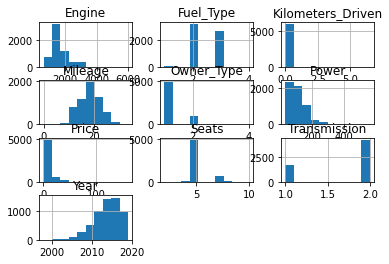

In [ ]:
#distribusi frekuensi dalam diagram 
mobil_df.hist()
plt.show()

<function matplotlib.pyplot.show>

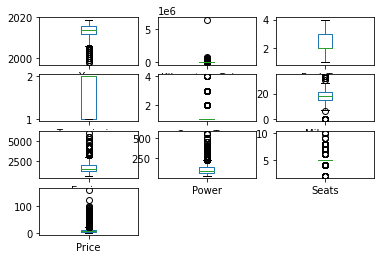

In [ ]:
mobil_df.plot(kind='box', subplots=True, layout=(4,3), sharex=False, sharey=False)
plt.show

In [ ]:
mobil_df.describe()

,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
count,5872.000000,5.872000e+03,5872.000000,5872.000000,5872.000000,5872.000000,5872.000000,5872.000000,5872.000000,5872.000000
mean,2013.477691,5.831700e+04,2.446185,1.710150,1.195504,18.277839,1625.745572,113.276894,5.283719,9.603919
std,3.164568,9.216941e+04,0.518930,0.453731,0.445948,4.365657,601.641783,53.881892,0.805081,11.249453
min,1998.000000,1.710000e+02,1.000000,1.000000,1.000000,0.000000,624.000000,34.200000,2.000000,0.440000
25%,2012.000000,3.342250e+04,2.000000,1.000000,1.000000,15.260000,1198.000000,75.000000,5.000000,3.517500
50%,2014.000000,5.260900e+04,2.000000,2.000000,1.000000,18.200000,1495.500000,97.700000,5.000000,5.750000
75%,2016.000000,7.240275e+04,3.000000,2.000000,1.000000,21.100000,1991.000000,138.100000,5.000000,10.000000
max,2019.000000,6.500000e+06,4.000000,2.000000,4.000000,33.540000,5998.000000,560.000000,10.000000,160.000000


# **Nomor 5 (v2)**

In [ ]:
mobil_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5872 entries, 0 to 5871
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               5872 non-null   object 
 1   Location           5872 non-null   object 
 2   Year               5872 non-null   int64  
 3   Kilometers_Driven  5872 non-null   int64  
 4   Fuel_Type          5872 non-null   int64  
 5   Transmission       5872 non-null   int64  
 6   Owner_Type         5872 non-null   int64  
 7   Mileage            5872 non-null   float64
 8   Engine             5872 non-null   int64  
 9   Power              5872 non-null   float64
 10  Seats              5872 non-null   float64
 11  Price              5872 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 550.6+ KB


In [ ]:
mobil_df['Kilometers_Driven'].describe()

count    5.872000e+03
mean     5.831700e+04
std      9.216941e+04
min      1.710000e+02
25%      3.342250e+04
50%      5.260900e+04
75%      7.240275e+04
max      6.500000e+06
Name: Kilometers_Driven, dtype: float64

dari data pada kolom kilometers_driven diatas, dapat diambil kesimpulan bahwa kilometer total jarak pemakaian rata-rata adalah 58317 km, standar deviasi 92169.41, kuartil 1 pada jarak 33422.5, kuartil 2 pada jarak 52609, dan kuartil 3 pada jarak 72402,75 

**mengetahui pengaruh tipe kepemilikan (owner type) dengan total jarak kilometer**

In [ ]:
df = pd.DataFrame(mobil_df, columns=['Owner_Type', 'Kilometers_Driven'])
df[:5]

,Owner_Type,Kilometers_Driven
0,1,72000
1,1,41000
2,1,46000
3,1,87000
4,2,40670


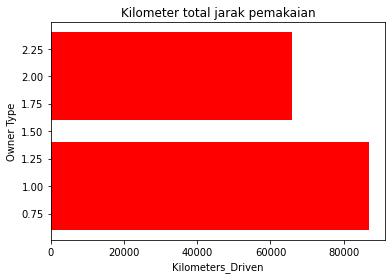

In [ ]:
indeks = np.array(df['Owner_Type'])
plt.barh(indeks[1:10], df['Kilometers_Driven'].iloc[1:10], color='r')
plt.title('Kilometer total jarak pemakaian')
plt.xlabel('Kilometers_Driven')
plt.ylabel('Owner Type')
plt.show()

# **Nomor 8**

In [ ]:
#filter pemilik mobil kepemilikan ketiga
filter_owner = df_transform[df_transform.Owner_Type >= 3]
filter_owner_df = pd.DataFrame(filter_owner)

count_owner = filter_owner_df.Owner_Type
number_of_rows = len(count_owner)
# print(number_of_rows)
print('Jumlah mobil yang pemiliknya merupakan kepemilikan ketiga atau lebih sebanyak', number_of_rows, 'mobil')

Jumlah mobil yang pemiliknya merupakan kepemilikan ketiga atau lebih sebanyak 108 mobil


# **Nomor 9**

In [ ]:
#klustering dengan kmeans
#read data mobil bekas
data_car = pd.read_csv('transform_ok.csv')
data_car.head()

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.60,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.20,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.20,1199,88.70,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.80,5.0,17.74


In [ ]:
sel_column = data_car.loc[:,['Fuel_Type', 'Mileage', 'Engine']]
sel_column.head()

,Fuel_Type,Mileage,Engine
0,1,26.60,998
1,2,19.67,1582
2,3,18.20,1199
3,2,20.77,1248
4,2,15.20,1968


In [ ]:
array_data = np.array(sel_column)
print(array_data)

[[1.000e+00 2.660e+01 9.980e+02]
 [2.000e+00 1.967e+01 1.582e+03]
 [3.000e+00 1.820e+01 1.199e+03]
 ...
 [2.000e+00 1.400e+01 2.498e+03]
 [3.000e+00 1.890e+01 9.980e+02]
 [2.000e+00 2.544e+01 9.360e+02]]


In [ ]:
# Menentukan dan mengkonfigurasi fungsi kmeans
kmeans = KMeans(n_clusters = 2, random_state=1)
# Menentukan kluster dari dat
kmeans.fit(array_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=1, tol=0.0001, verbose=0)

In [ ]:
cluster = kmeans.cluster_centers_
print(cluster)

[[2.58919445e+00 1.98806230e+01 1.29772986e+03]
 [2.11287578e+00 1.45422518e+01 2.39024731e+03]]


In [ ]:
# Menampilkan hasil kluster
print(kmeans.labels_)
# Menambahkan kolom "kluster" 
data_car["kluster"] = kmeans.labels_
data_car.head()

[0 0 0 ... 1 0 0]


,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price,kluster
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.60,998,58.16,5.0,1.75,0
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.20,5.0,12.50,0
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.20,1199,88.70,5.0,4.50,0
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00,0
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.80,5.0,17.74,1


In [ ]:
#save to csv
data_car.to_csv('nomor9.csv', index=False)

In [ ]:
#hasil kluster dalam bentuk plotting
# fig, ax = plt.subplots()
# sct = ax.scatter(array_data[:,0], array_data[:,1], s = 100,
# c = data_car.kluster, marker = "o", alpha = 0.5)
# centers = kmeans.cluster_centers_
# ax.scatter(centers[:,0], centers[:,1], c='blue', s=200, alpha=0.5)
# plt.title("Hasil Klustering K-Means")
# plt.xlabel("Scaled Fuel_Type")
# plt.ylabel("Scaled Mileage")
# plt.show()

IndexError: ignored

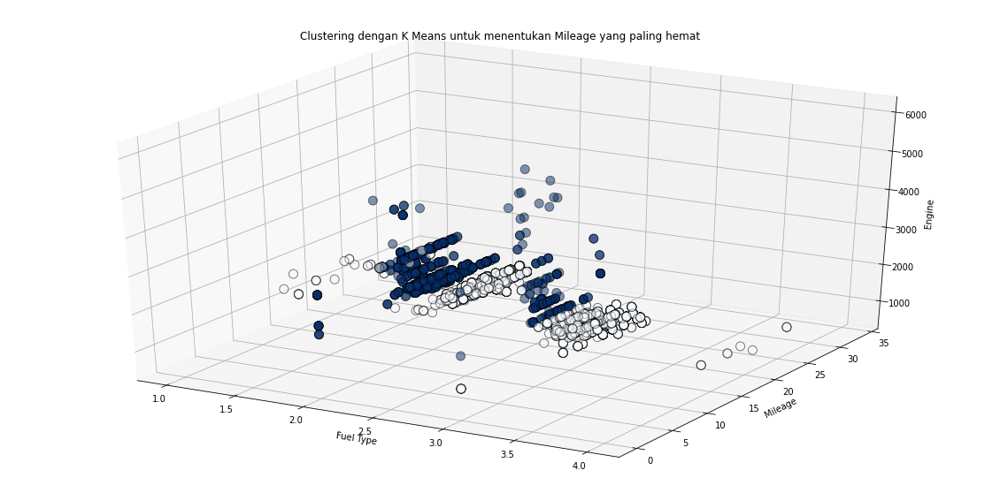

In [ ]:
#visualisasi kluster 
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(array_data[:,0],array_data[:,1],array_data[:,2], 
           c=data_car.kluster, cmap='Blues', edgecolor='k', s=100, alpha = 0.5)


ax.set_title("Clustering dengan K Means untuk menentukan Mileage yang paling hemat")
ax.set_xlabel("Fuel Type")
ax.set_ylabel("Mileage")
ax.set_zlabel("Engine")
ax.dist = 10

ax.scatter(centers[:,0], centers[:,1], centers[:,2], s = 300, c = 'r', marker='s', label = 'Centroid')

plt.autoscale(enable=True, axis='x', tight=True)    
# plt.legend(loc='lower right')
plt.show()

# Nomor 6

**NOMOR 6** *Outlier pada Kilometers_Driven dgn (BUAT PLOT)(MIN-MAX)*

In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt #library untuk plotting 
import seaborn as sn
from sklearn import linear_model
import sklearn.metrics as SM
import matplotlib.pyplot as plt
import seaborn as sns
import csv

In [ ]:
data = pd.read_csv("transform_ok.csv")
df = pd.DataFrame(data)
df

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,1,2,1,26.60,998,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,2,2,1,19.67,1582,126.20,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,3,2,1,18.20,1199,88.70,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,2,2,1,20.77,1248,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,2,1,2,15.20,1968,140.80,5.0,17.74
...,...,...,...,...,...,...,...,...,...,...,...,...
5867,Maruti Swift VDI,Delhi,2014,27365,2,2,1,28.40,1248,74.00,5.0,4.75
5868,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,2,2,1,24.40,1120,71.00,5.0,4.00
5869,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,2,2,2,14.00,2498,112.00,8.0,2.90
5870,Maruti Wagon R VXI,Kolkata,2013,46000,3,2,1,18.90,998,67.10,5.0,2.65


In [ ]:
df1 = df[['Kilometers_Driven']] #fungsi untuk mengambil atribut apa saja yang ingin digunakan
df1 #menampilkan

dataset = df1 #menggantikan variabel df1 menjadi dataset
dataset #menampilkan output dari dataset

In [ ]:
df1.describe()

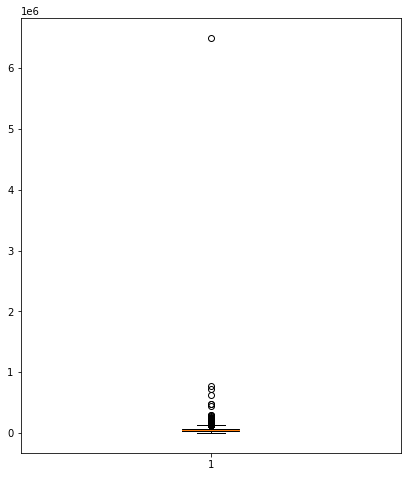

In [ ]:
f = plt.figure(figsize=(15,8))
f.add_subplot(1,2,2)
plt.boxplot(df['Kilometers_Driven'])
plt.show()


# Nomor 7

In [ ]:
df2 = df[['Year','Kilometers_Driven']] #fungsi untuk mengambil atribut apa saja yang ingin digunakan
df2 = df2.sort_values('Year', ascending=True) #menampilkan

dataset2 = df2 #menggantikan variabel df2 menjadi dataset2
dataset2 #menampilkan output dari dataset2

In [ ]:
korelasi = dataset2.corr(method = 'spearman') #menggunakan library korelasi dengan metode kendall
korelasi #output hasil korelasi

In [ ]:
# menampilkan hasil korelasi dengan tabel agar lebih mudah dipahami, semakin terang warna maka korelasinya semakin tinggi atau bagus
f,ax = plt.subplots(figsize=(8,8))
sns.heatmap(korelasi, annot=True, linewidths=.5, fmt='.3f', ax=ax)
sns.jointplot(x='Year', y='Kilometers_Driven', data=dataset2)
plt.show

sampe sini aja, yg dibawah abaikan

In [ ]:
X = dataset2.iloc[:, 0].values.reshape(-1,1) #X data yang digunakan pada attribut 1
X
#X_Baru = pd.DataFrame(X) #memasukkan data X ke dataframe agar dapat dioutputkan dan diganti dengan variable baru
#X_Baru

In [ ]:
y = dataset2.iloc[:, 1].values.reshape(-1,1) #y data yang digunakan dari attribut 2 (artinya hanya attribut ke 2)
y

array([[95150],
       [95150],
       [55300],
       ...,
       [ 4000],
       [24950],
       [14648]])

In [ ]:
#Fitting multiple Linear Regression 
from sklearn.linear_model import LinearRegression #import library linear regresi
regressor = LinearRegression() #variabel regressor untuk library linear regressor
regressor.fit(y, X) #menentukan x dan y

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
import statsmodels.api as sma #import library untuk menghitung nilai estimasi
X = sma.add_constant(X) #menentukan intercept, sehingga di hasil regresi memiliki nilai intercept/konstanta

X_opt = X #attribut yang digunakan (sesuai dari attribut yang dipakai diatas)
regressor_OLS = sma.OLS(endog = y, exog = X_opt).fit()
print(regressor_OLS.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     173.4
Date:                Sun, 19 Jul 2020   Prob (F-statistic):           4.87e-39
Time:                        13:04:27   Log-Likelihood:                -75371.
No. Observations:                5872   AIC:                         1.507e+05
Df Residuals:                    5870   BIC:                         1.508e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       9.991e+06   7.54e+05     13.244      0.0

In [ ]:
#df3 = sns.load_dataset(df2)
#sns.regplot(x='Year', y='Kilometers_Driven', data=df3)
#plt.show()

# Nomor 10

In [ ]:
# menampilkan hasil korelasi dengan tabel agar lebih mudah dipahami, semakin terang warna maka korelasinya semakin tinggi atau bagus
f,ax = plt.subplots(figsize=(8,8))
sns.heatmap(korelasi, annot=True, linewidths=.5, fmt='.3f', ax=ax)
plt.show

In [ ]:
korelasi = dataset3.corr(method = 'spearman') #menggunakan library korelasi dengan metode kendall
korelasi #output hasil korelasi

,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
Year,1.000000,-0.552116,-0.082430,-0.080250,-0.346791,0.271747,-0.071242,0.026994,0.030759,0.473905
Kilometers_Driven,-0.552116,1.000000,-0.264760,0.115387,0.233869,-0.138141,0.201350,0.043460,0.200282,-0.203778
Fuel_Type,-0.082430,-0.264760,1.000000,0.120023,0.036212,-0.130202,-0.486067,-0.309853,-0.296017,-0.413867
Transmission,-0.080250,0.115387,0.120023,1.000000,-0.003326,0.369771,-0.480157,-0.595427,0.073364,-0.575698
Owner_Type,-0.346791,0.233869,0.036212,-0.003326,1.000000,-0.152027,0.057302,0.020019,-0.004718,-0.173786
Mileage,0.271747,-0.138141,-0.130202,0.369771,-0.152027,1.000000,-0.610345,-0.575349,-0.354578,-0.309770
Engine,-0.071242,0.201350,-0.486067,-0.480157,0.057302,-0.610345,1.000000,0.878348,0.386691,0.677776
Power,0.026994,0.043460,-0.309853,-0.595427,0.020019,-0.575349,0.878348,1.000000,0.215362,0.760868
Seats,0.030759,0.200282,-0.296017,0.073364,-0.004718,-0.354578,0.386691,0.215362,1.000000,0.222849
Price,0.473905,-0.203778,-0.413867,-0.575698,-0.173786,-0.309770,0.677776,0.760868,0.222849,1.000000


Pengaruh Harga terhadap variabel yang lain

In [ ]:
df3 = df.sort_values('Price', ascending=True) #menampilkan

dataset3 = df3 #menggantikan variabel df3 menjadi dataset3
dataset3 #menampilkan output dari dataset3

In [ ]:
X = dataset3.iloc[:, 2:11].values #X data yang digunakan pada attribut 1
X
X_Baru = pd.DataFrame(X) #memasukkan data X ke dataframe agar dapat dioutputkan dan diganti dengan variable baru
X_Baru

In [ ]:
y = dataset3.iloc[:, 11].values.reshape(-1,1) #y data yang digunakan dari attribut 2 (artinya hanya attribut ke 2)
y

In [ ]:
#Fitting multiple Linear Regression 
from sklearn.linear_model import LinearRegression #import library linear regresi
regressor = LinearRegression() #variabel regressor untuk library linear regressor
regressor.fit(X, y) #menentukan x dan y

In [ ]:
import statsmodels.api as sma #import library untuk menghitung nilai estimasi
X = sma.add_constant(X) #menentukan intercept, sehingga di hasil regresi memiliki nilai intercept/konstanta

X_opt = X #attribut yang digunakan (sesuai dari attribut yang dipakai diatas)
regressor_OLS = sma.OLS(endog = y, exog = X_opt).fit()
print(regressor_OLS.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     1502.
Date:                Sun, 19 Jul 2020   Prob (F-statistic):               0.00
Time:                        14:50:07   Log-Likelihood:                -19033.
No. Observations:                5872   AIC:                         3.809e+04
Df Residuals:                    5862   BIC:                         3.815e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2101.4917     60.750    -34.593      0.0

In [ ]:
#df3 = sns.load_dataset(df2)
#sns.regplot(x='Year', y='Kilometers_Driven', data=df3)
#plt.show()

# Nomor 12 : Klasifikasi dengan PNN

In [ ]:
pip install neupy

In [ ]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score
from neupy import algorithms

np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'invalid': 'ignore', 'over': 'warn', 'under': 'ignore'}

In [ ]:
data = pd.read_csv("transform_ok.csv")
df = pd.DataFrame(data)

In [ ]:
x = pd.DataFrame(df)
x

In [ ]:
from sklearn.model_selection import train_test_split #import library untuk proses splitting data dengan metode train test split
x_train, x_test = train_test_split(x, test_size = 0.3, random_state = 0) #parameter yang digunakan 70 30

In [ ]:
target_encoder = LabelEncoder()
x_train['Target'] = target_encoder.fit_transform(x_train['Owner_Type'])
x_test['Target'] = target_encoder.fit_transform(x_test['Owner_Type'])

In [ ]:
x_train = x_train.drop(['Name', 'Location', 'Owner_Type'], axis=1)
x_test = x_test.drop(['Name', 'Location', 'Owner_Type'], axis=1)
y_train = x_train['Target']
y_test = x_test['Target']

In [ ]:
model_pnn = algorithms.PNN(std=0.001)
model_pnn.train(x_train, y_train)
predicted = model_pnn.predict(x_test)
accuracy_pnn = accuracy_score(predicted, y_test) * 100
print('Akurasi menggunakan Hold-out dengan rasio 70:30 = %s' % accuracy_pnn)

In [ ]:
spread_values = [ 0.1, 0.01, 0.001, 0.0001, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 1]
new_df = pd.DataFrame()
for spread_value in spread_values:    
    model_pnn = algorithms.PNN(std=spread_value)
    model_pnn.train(x_train, y_train)
    predicted = model_pnn.predict(x_test)
    accuracy_pnn = accuracy_score(predicted, y_test) * 100

    new_df = new_df.append({
        'spread_value': spread_value, 
        'akurasi_pnn': accuracy_pnn, 
    }, ignore_index=True)
new_df

In [ ]:
x_test

In [ ]:
x_train